### Zadania

Celem listy jest zbadanie działania metod binaryzacji obrazów w skali szarości i kolorowych. Dążymy do wyobrębnienia obiektów znajdujących się na podanych obrazach, tzn. uzyskania separacji obiektów od tła, a także oddzielenia poszczególnych obiektów. Natomiast samo osiągnięcie "jakiegoś" wyniku ([`cv2.threshold`](https://docs.opencv.org/3.4/d7/d1b/group__imgproc__misc.html#gae8a4a146d1ca78c626a53577199e9c57) odpalone, próg wybrany "z palca", _coś tam_ wychodzi, wynik wyświetlony) to co najwyżej połowa sukcesu i oceny. Ważne jest przeprowadzenie eksperymentów wyjaśniających dobór parametrów.

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from Lab1.lab1_utils import (
    compare_threshold_methods,
    show_histogram,
    binarize_grid_otsu,
    display_images,
)
from PIL import Image

##### Zad. 1: Monety szare

Dane są dwa czarno-białe obrazy monet, `monety_szare` oraz `monety_szare_szum`, z których drugi zawiera pewien poziom zakłóceń. Dokonaj binaryzacji tych obrazów za pomocą progowania.  
Jak wartość progu wpływa na wyniki?  
Jaki wpływ mają zakłócenia w drugim obrazie? Co można wobec nich zrobić?

In [2]:
monety_szare = cv2.imread("dane/Monety_szare.bmp", cv2.IMREAD_GRAYSCALE)
monety_szum = cv2.imread("dane/Monety_szare_szum.bmp", cv2.IMREAD_GRAYSCALE)

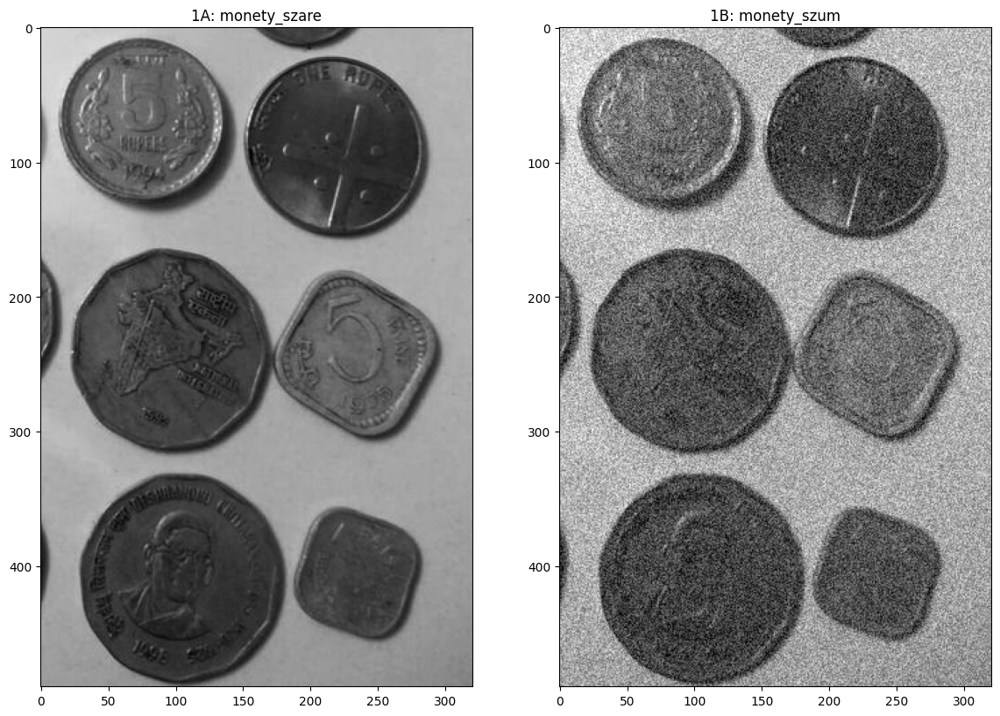

In [3]:
_, (a, b) = plt.subplots(1, 2, figsize=(14, 10))
a.imshow(monety_szare, cmap="gray")
a.title.set_text("1A: monety_szare")
b.imshow(monety_szum, cmap="gray")
b.title.set_text("1B: monety_szum")

Rozwiązanie części 1A:

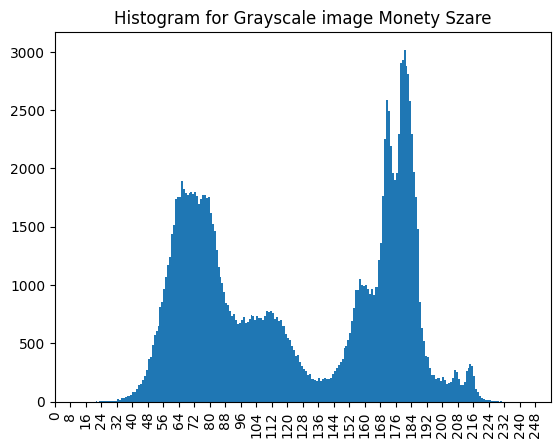

In [4]:
show_histogram(monety_szare, "Monety Szare")

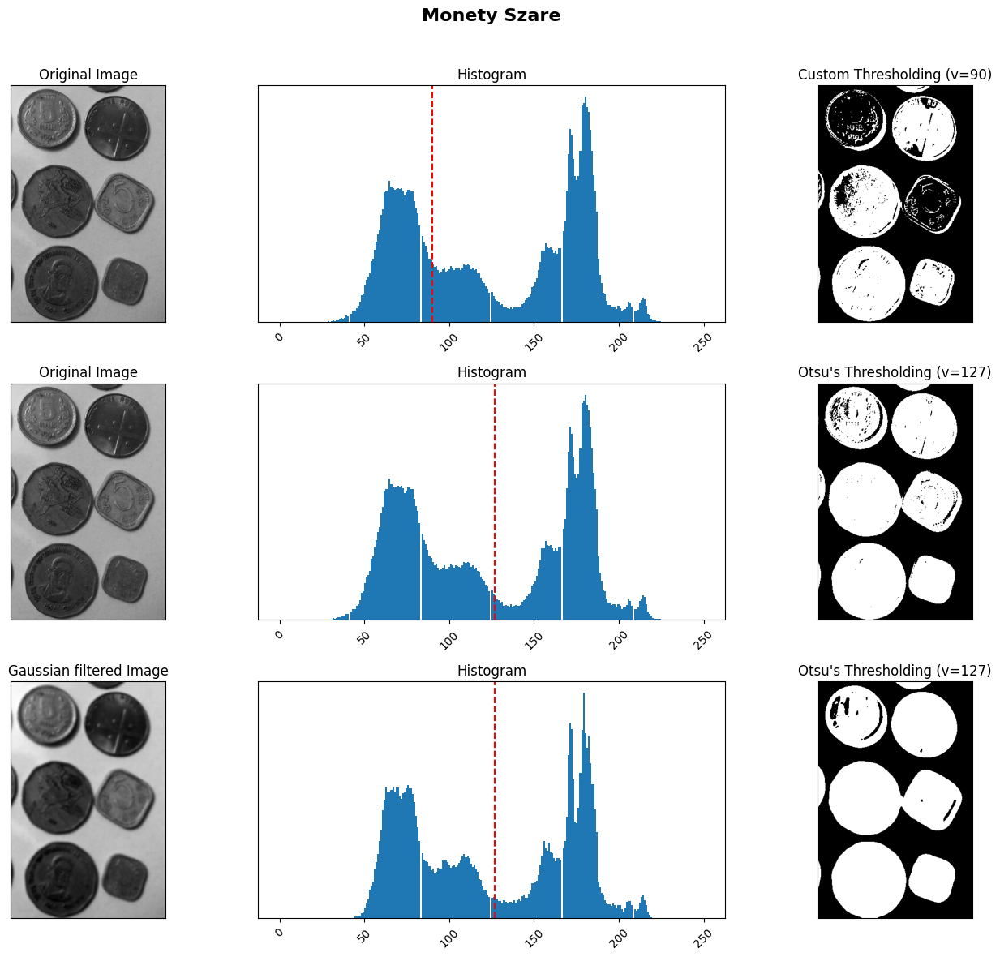

In [36]:
compare_threshold_methods(monety_szare, "Monety Szare", 90, original_blur=False)

Rozwiązanie części 1B:


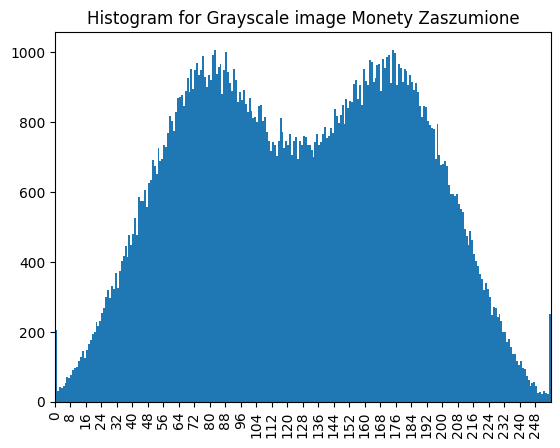

In [6]:
show_histogram(monety_szum, "Monety Zaszumione")

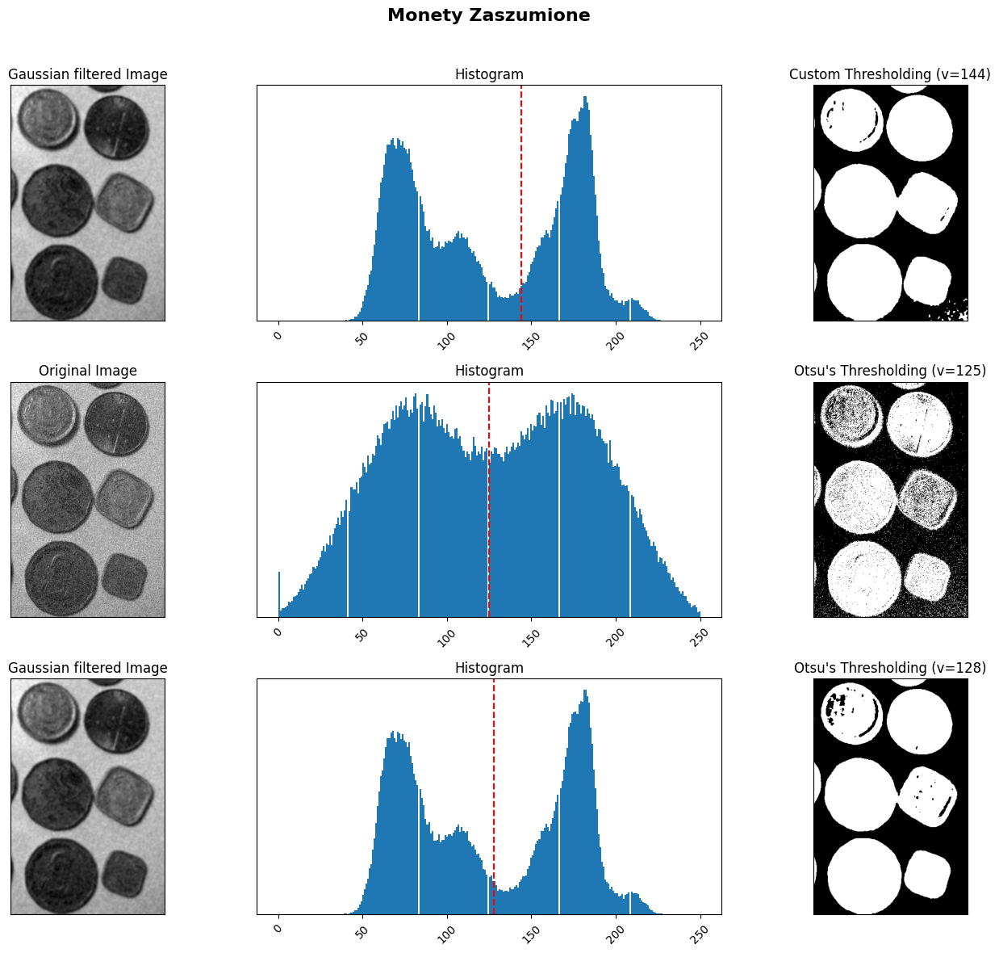

In [7]:
compare_threshold_methods(monety_szum, "Monety Zaszumione", original_blur=True)

##### Zad. 2: Monety kolorowe

Na podobnej zasadzie dokonaj binaryzacji poniższego obrazu kolorowego.  
Skorzystaj z modelu barw HSV. Uzasadnij dobór kanału oraz progu binaryzacji.

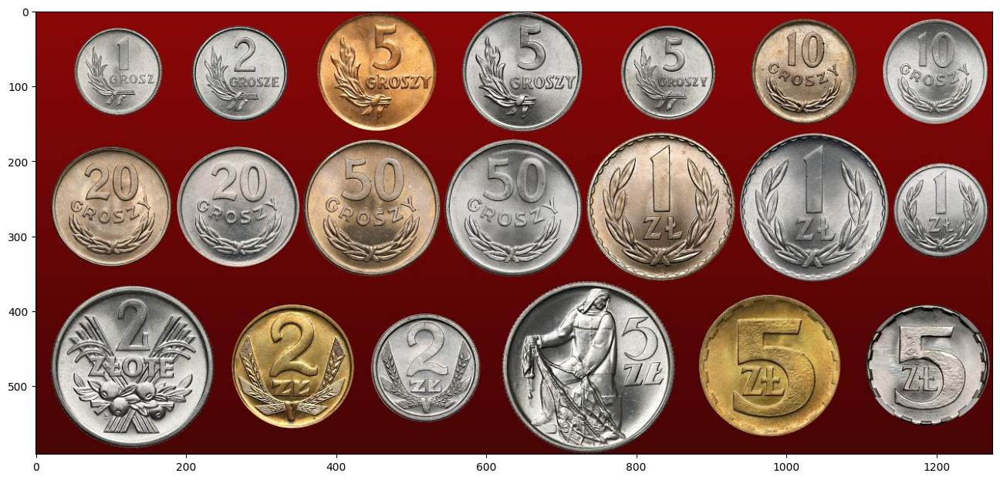

In [8]:
monety_kolor = cv2.imread("dane/Monety_kolor.bmp")
plt.subplots(1, 1, figsize=(16, 8))[1].imshow(monety_kolor[..., ::-1]);

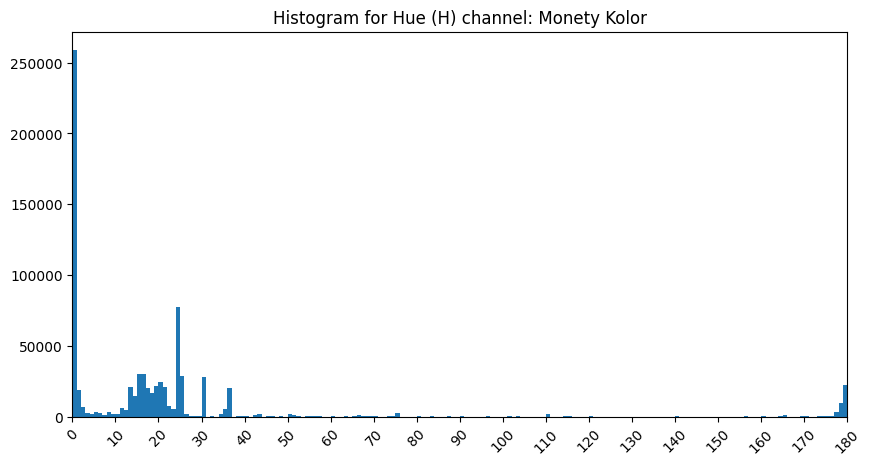

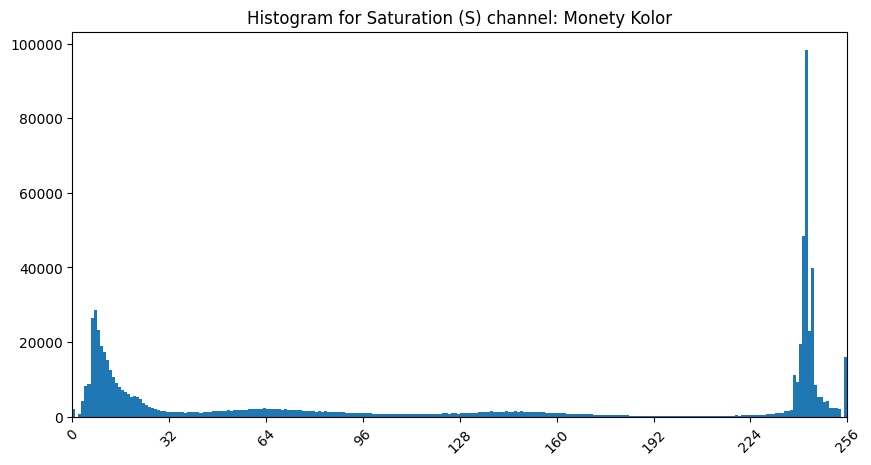

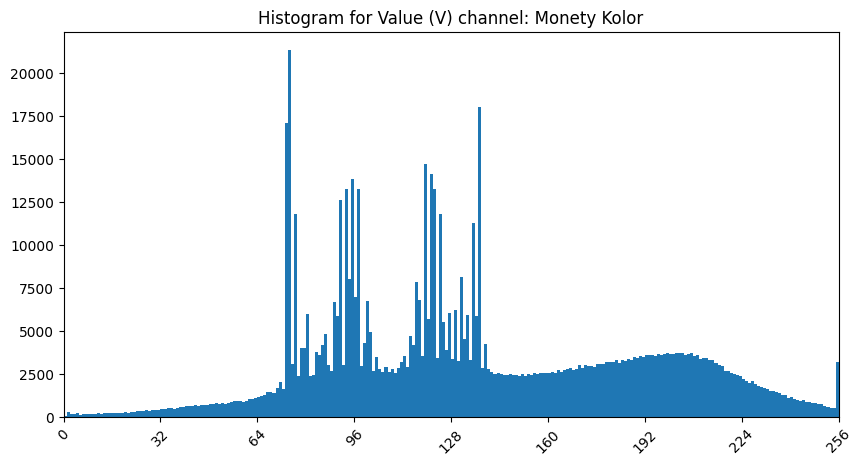

In [9]:
monety_kolor = cv2.cvtColor(monety_kolor, cv2.COLOR_BGR2HSV)
show_histogram(monety_kolor, "Monety Kolor")

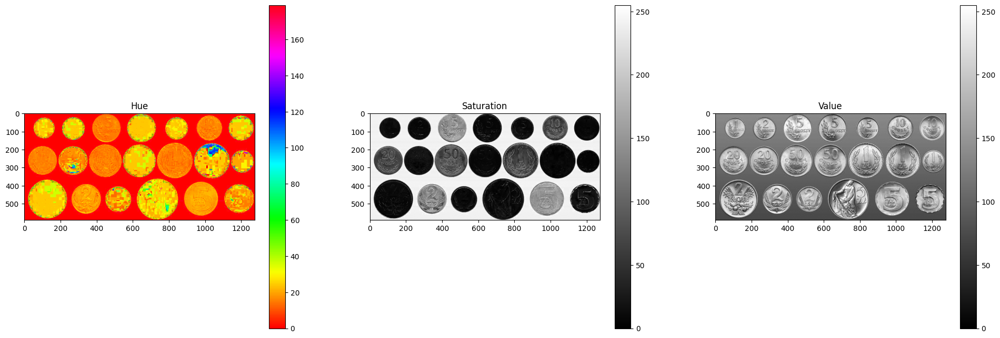

In [10]:
h, s, v = cv2.split(monety_kolor)

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(24, 8))

cax1 = ax1.imshow(h, cmap="hsv")
ax1.set_title("Hue")
fig.colorbar(cax1, ax=ax1)

cax2 = ax2.imshow(s, cmap="gray")
ax2.set_title("Saturation")
fig.colorbar(cax2, ax=ax2)

cax3 = ax3.imshow(v, cmap="gray")
ax3.set_title("Value")
fig.colorbar(cax3, ax=ax3)

plt.show()

In [11]:
lower = np.array([0], np.uint8)
upper = np.array([232], np.uint8)
monety_kolor_blur = cv2.GaussianBlur(monety_kolor[:, :, 1], (5, 5), 0)
monety_kolor_mask = cv2.inRange(monety_kolor_blur, lower, upper)

In [12]:
# NAJGORSZEMU WROGOWI NIE ŻYCZE KORZYSTAĆ Z https://pinetools.com/image-color-picker - MAJĄ SATURATION W SKALI OD 0 DO 100
# PRZEZ 10 MINUT ROZMYŚLAŁEM JAKIM CUDEM TEN ZASIĘG TAK DOBRZE TO SEPARUJE, SKORO STRONA POKAZUJE ŻE TEN CZERWOONY TO JAKIEŚ 95 SATURATION XD

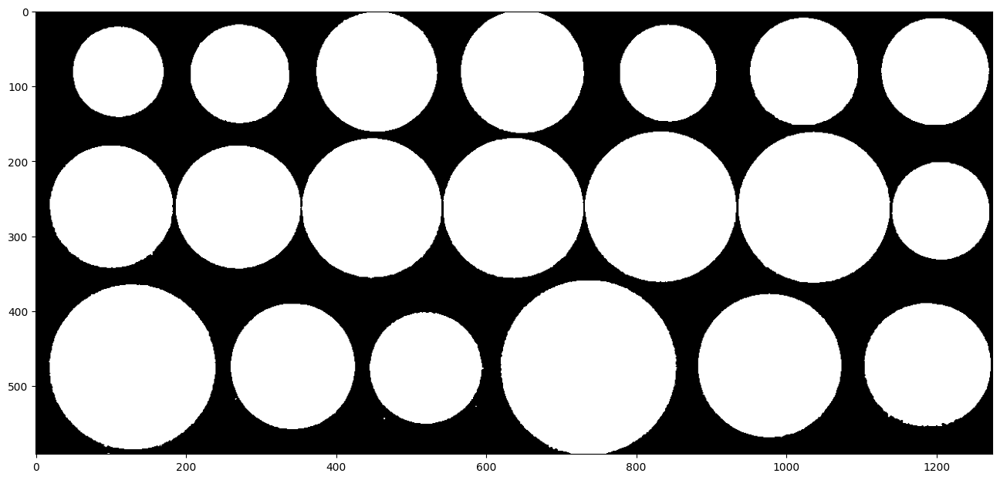

In [13]:
plt.subplots(1, 1, figsize=(16, 8))[1].imshow(monety_kolor_mask, cmap="gray")

In [14]:
# metoda otsu jest dość lipna, ponieważ chce aby był równy ważony rozkłąd wariancji, a tu chcemy zrobić hard cut-off na pewnym etapie

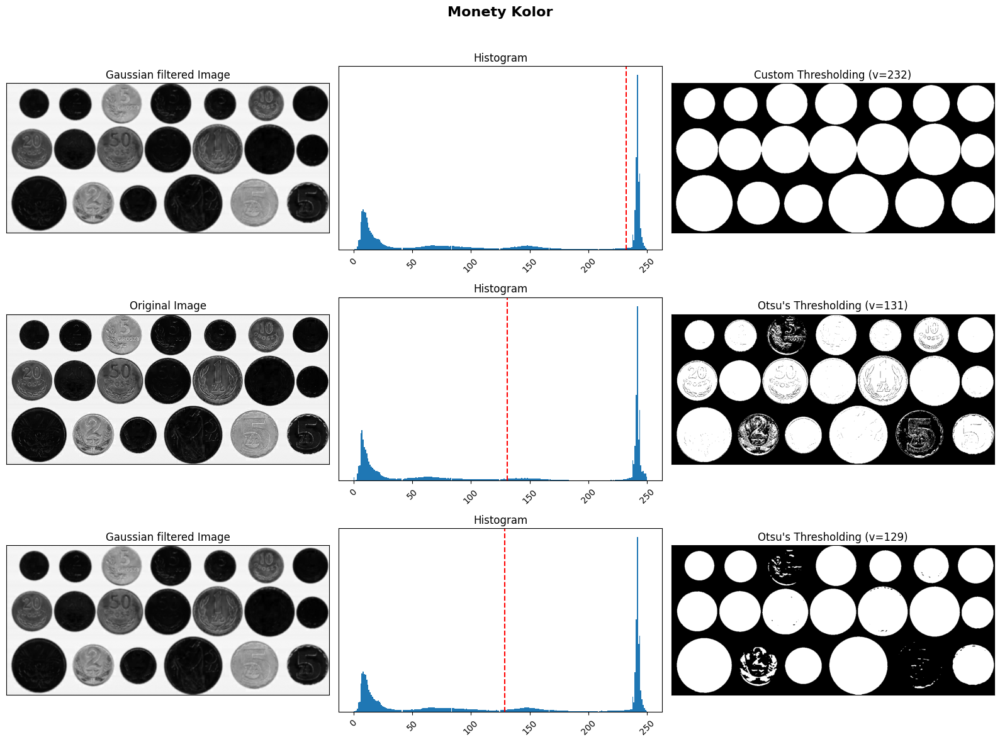

In [15]:
compare_threshold_methods(
    monety_kolor[:, :, 1], "Monety Kolor", 232, 255, original_blur=True
)

Przetestuj opracowany powyżej algorytm na poniższym obrazie z wyraźnym zaszumieniem. Co się zmienia i dlaczego? Co można poprawić?

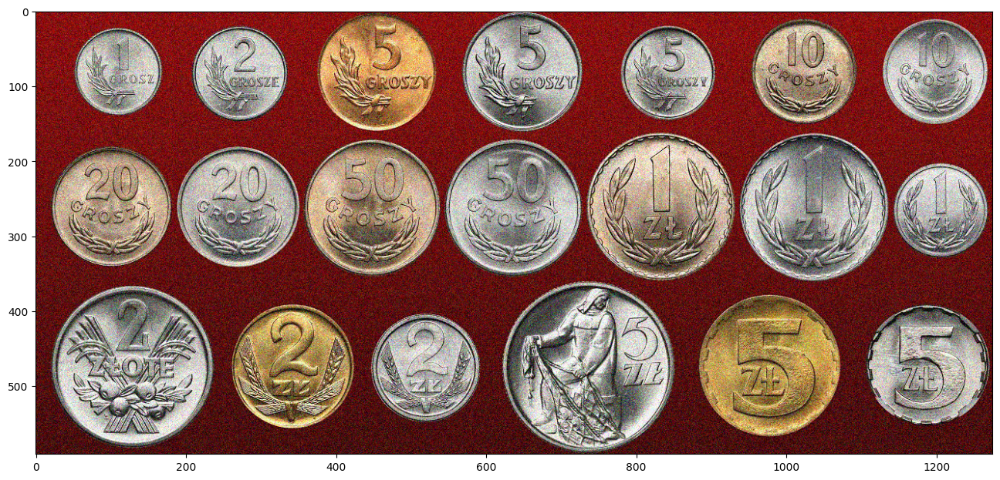

In [16]:
monety_kolor_szum_original = cv2.imread("dane/Monety_kolor_szum.bmp")
plt.subplots(1, 1, figsize=(16, 8))[1].imshow(monety_kolor_szum_original[..., ::-1]);

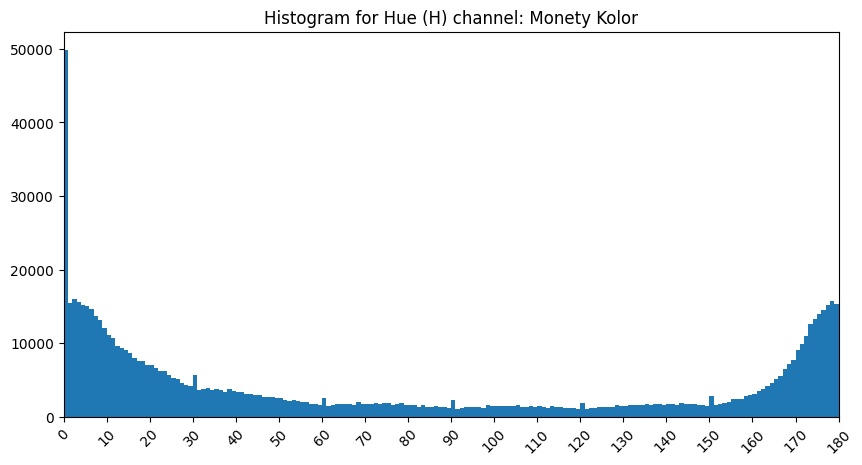

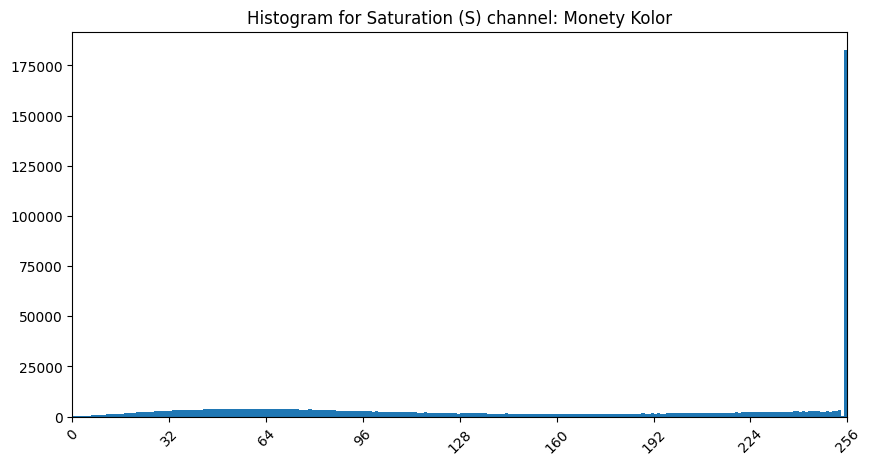

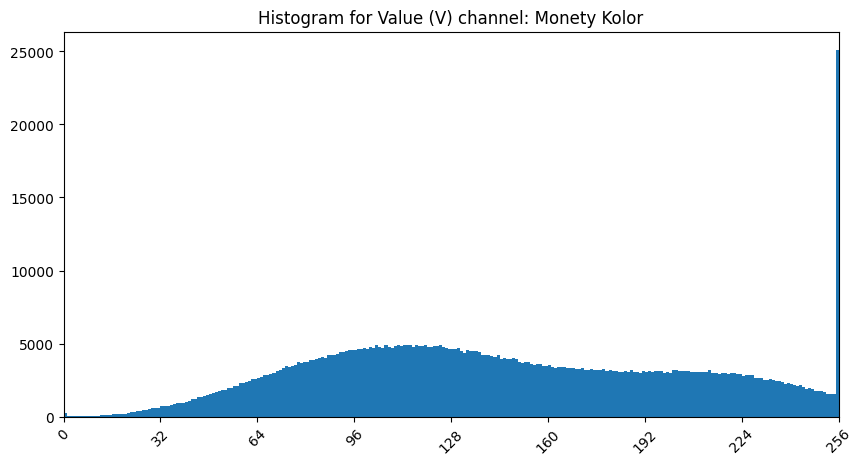

In [17]:
monety_kolor_szum = cv2.cvtColor(monety_kolor_szum_original, cv2.COLOR_BGR2HSV)
show_histogram(monety_kolor_szum, "Monety Kolor")

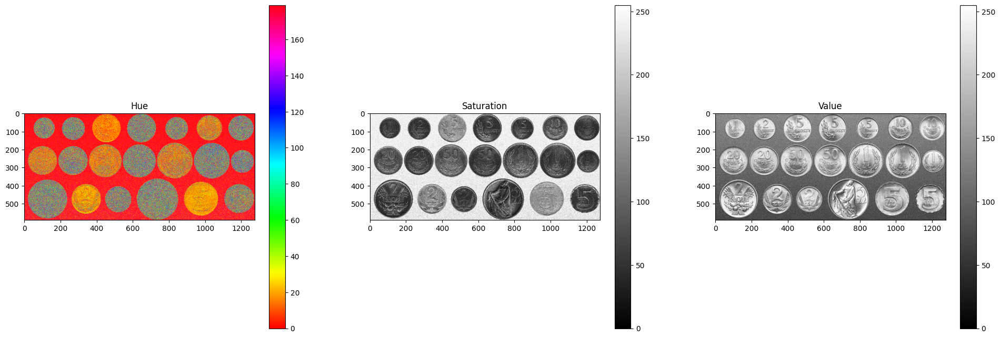

In [18]:
h, s, v = cv2.split(monety_kolor_szum)

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(24, 8))

cax1 = ax1.imshow(h, cmap="hsv")
ax1.set_title("Hue")
fig.colorbar(cax1, ax=ax1)

cax2 = ax2.imshow(s, cmap="gray")
ax2.set_title("Saturation")
fig.colorbar(cax2, ax=ax2)

cax3 = ax3.imshow(v, cmap="gray")
ax3.set_title("Value")
fig.colorbar(cax3, ax=ax3)

plt.show()

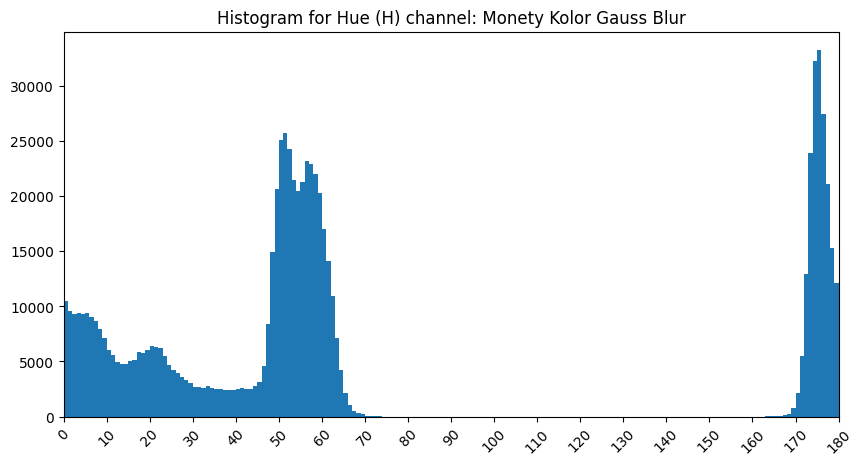

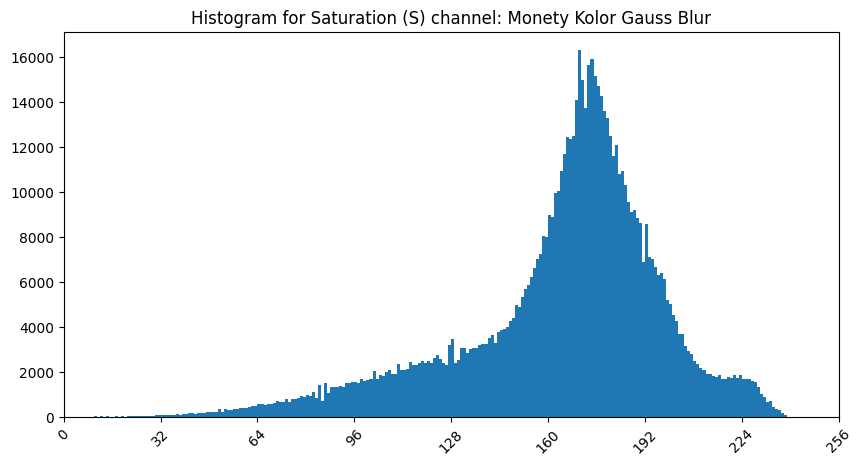

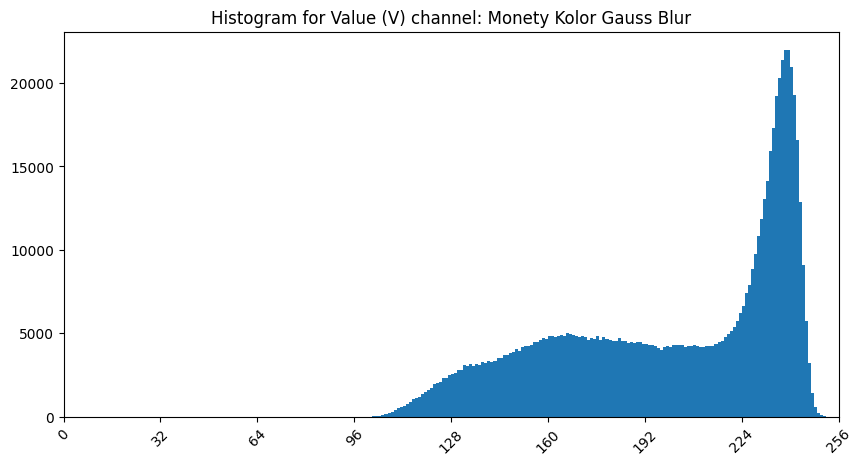

In [19]:
temp = cv2.cvtColor(cv2.GaussianBlur(monety_kolor_szum, (11, 11), 0), cv2.COLOR_BGR2HSV)
show_histogram(temp, "Monety Kolor Gauss Blur")

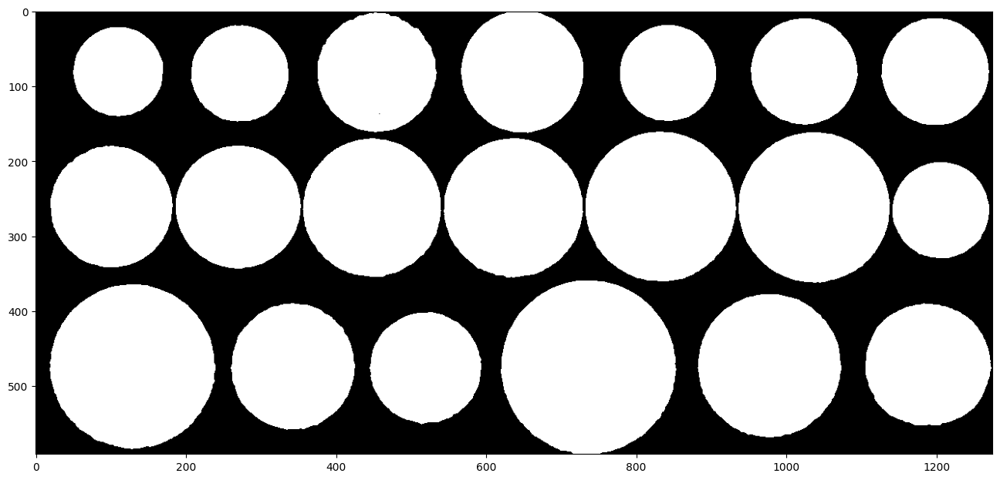

In [20]:
lower = np.array([0], np.uint8)
upper = np.array([200], np.uint8)
monety_kolor_szum_blur = cv2.GaussianBlur(monety_kolor_szum[:, :, 1], (11, 11), 0)
monety_kolor_szum_mask = cv2.inRange(monety_kolor_szum_blur, lower, upper)
plt.subplots(1, 1, figsize=(16, 8))[1].imshow(monety_kolor_szum_mask, cmap="gray")

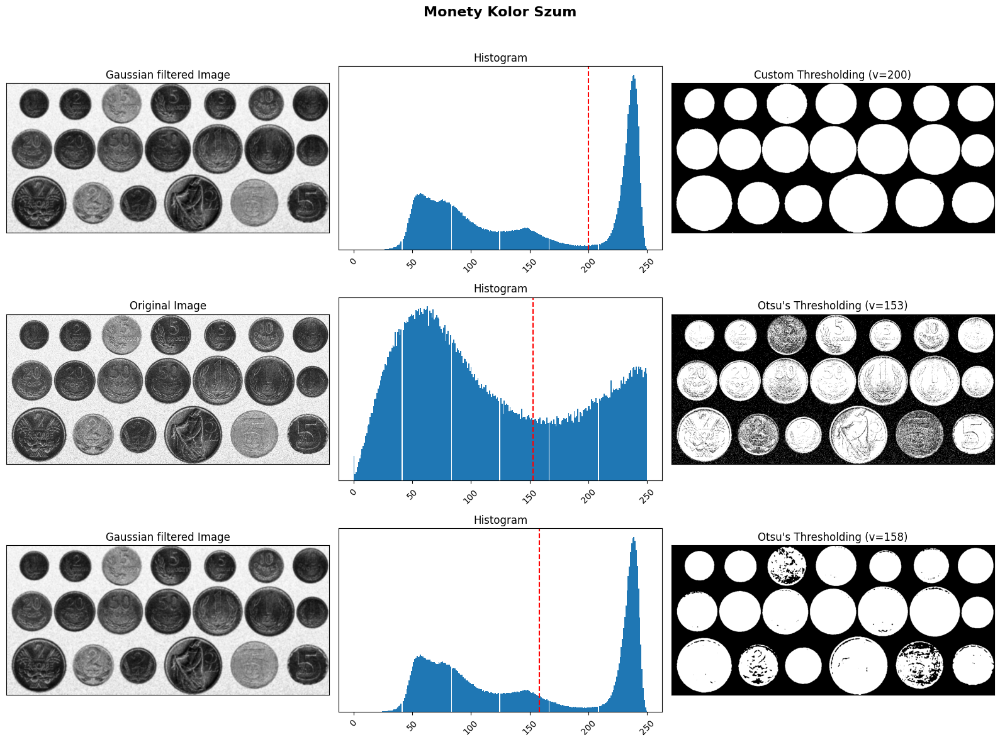

In [29]:
compare_threshold_methods(
    monety_kolor_szum[:, :, 1], "Monety Kolor Szum", 200, 255, original_blur=True
)

##### Zad. 3: Tekst

W tym przypadku należy wyodrębnić litery od bardzo nierównomiernie oświetlonego tła. Skorzystaj z binaryzacji metodą Otsu. Zastosuj binaryzację w sposób lokalny (oknem przesuwnym). Jaki wpływ ma rozmiar okna na jakość binaryzacji? Jak przesuwać okno?

_(Pełna punktacja za zadanie wymaga własnoręcznej implementacji okna przesuwnego i filtracji wewnątrz niego. Użycie zamiast tego_ `cv2.adaptiveThreshold` _liczone będzie jako pół zadania, ale jedynie po demonstracji zrozumienia tej metody.)_

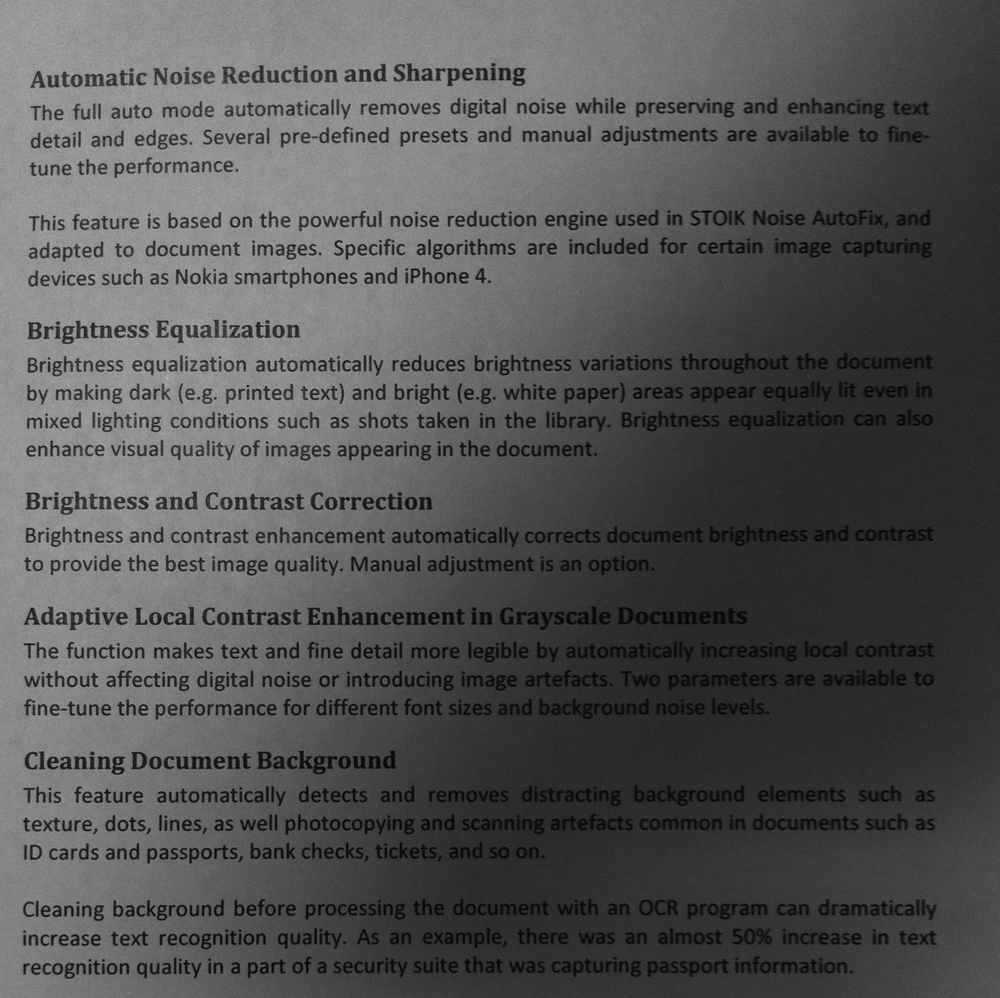

In [22]:
tekst_original = cv2.imread("dane/Tekst1.bmp", cv2.IMREAD_GRAYSCALE)
Image.fromarray(tekst_original)

Rozwiązanie:

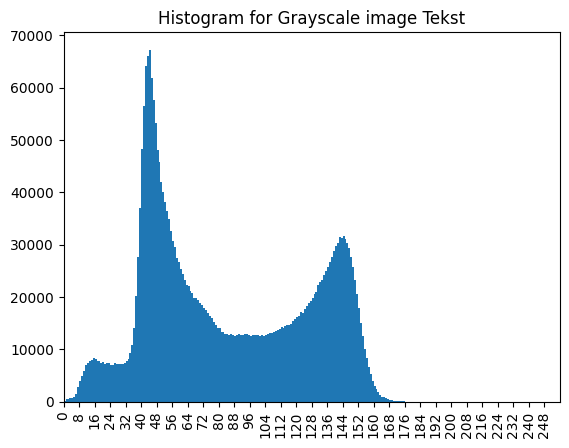

In [23]:
show_histogram(tekst_original, "Tekst")

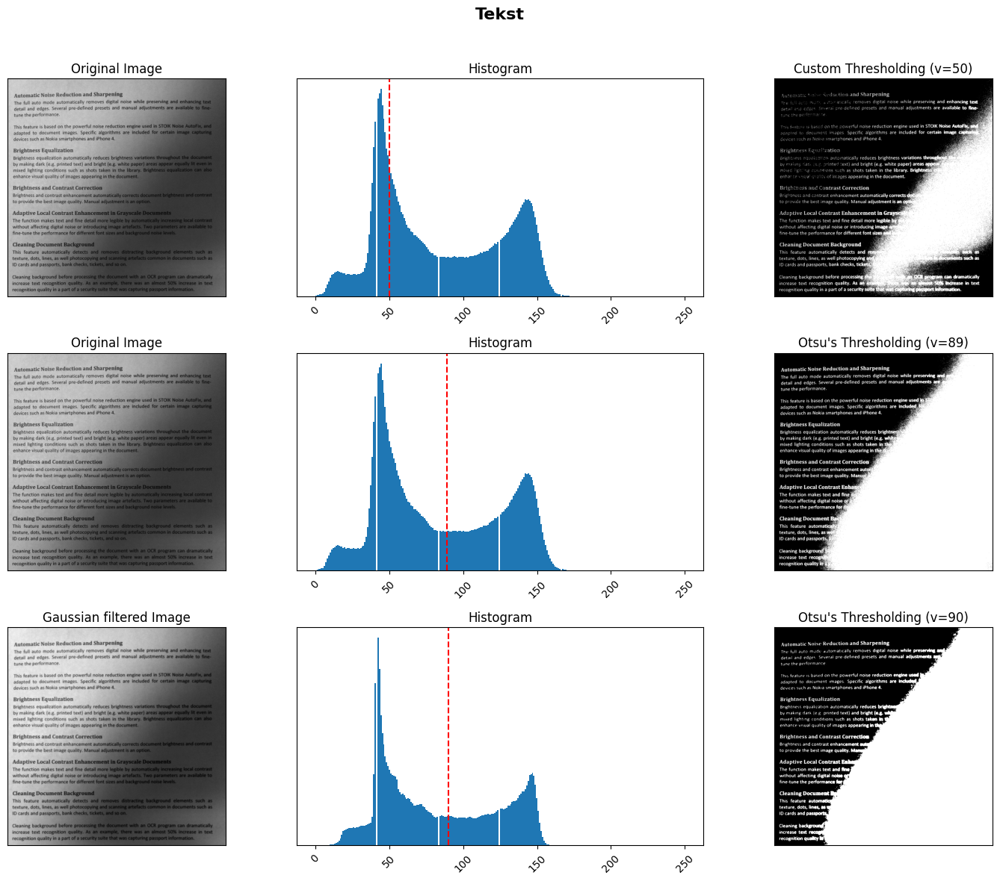

In [24]:
compare_threshold_methods(tekst_original, "Tekst", 50)

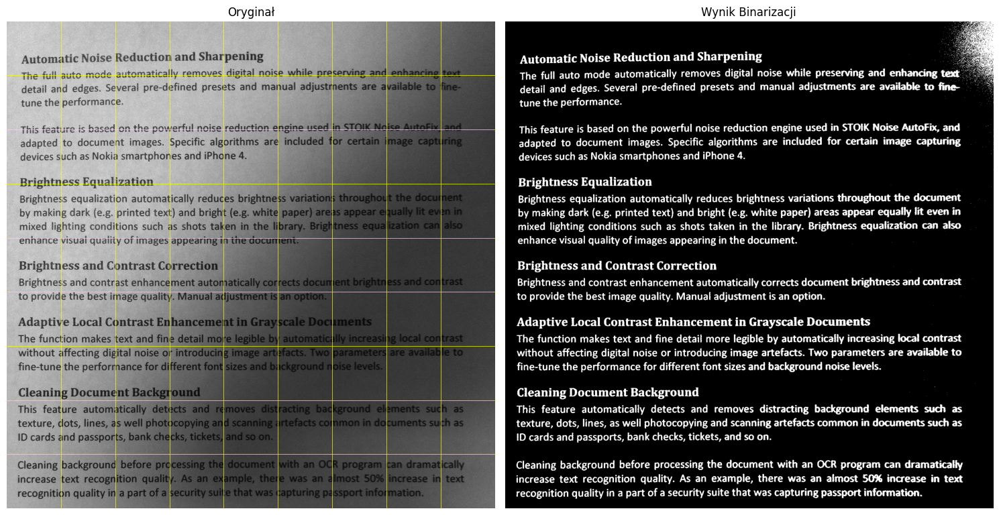

In [25]:
grid_size = (9, 9)
local_otsu_result = binarize_grid_otsu(tekst_original, grid_size)
display_images(tekst_original, local_otsu_result, grid=grid_size)

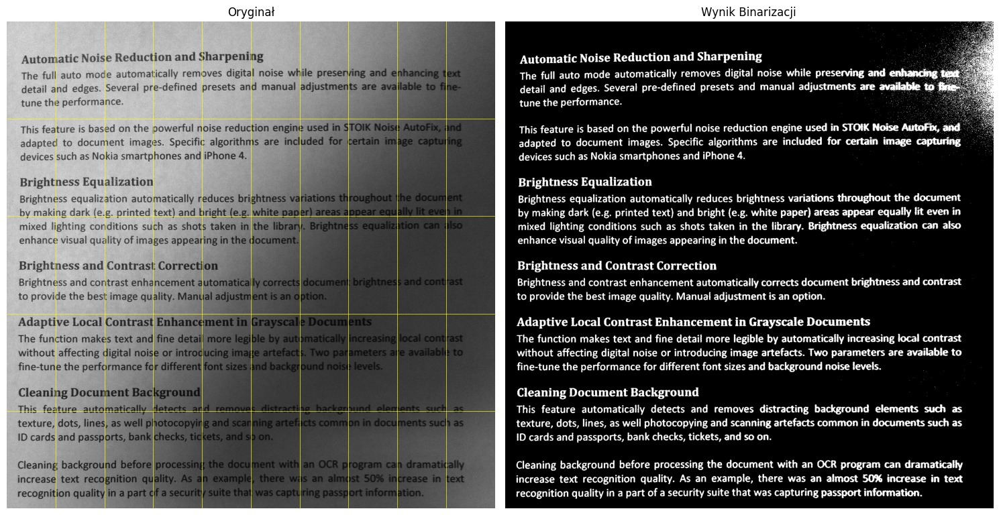

In [26]:
grid_size = (10, 5)
local_otsu_result = binarize_grid_otsu(tekst_original, grid_size)
display_images(tekst_original, local_otsu_result, grid=grid_size)

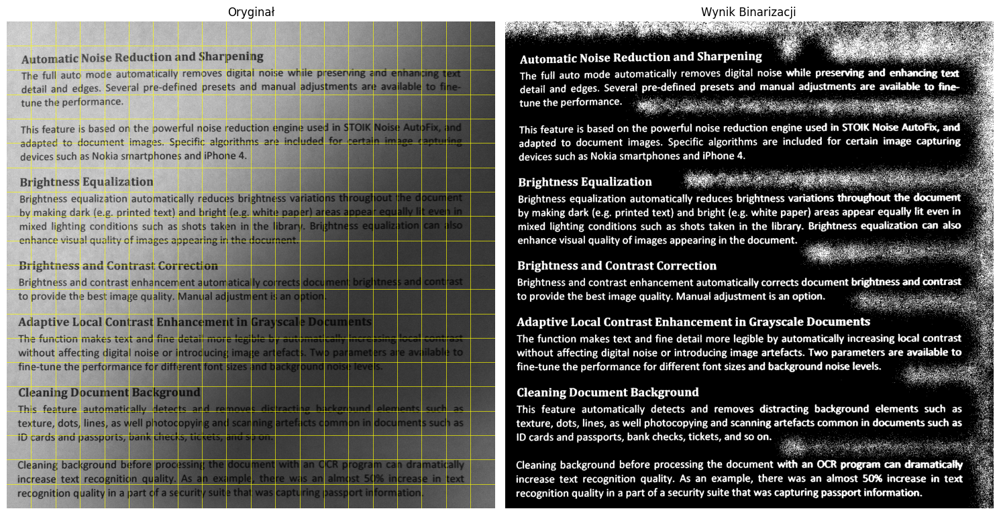

In [33]:
grid_size = (20, 20)
local_otsu_result = binarize_grid_otsu(tekst_original, grid_size, var_thresh=None)
display_images(tekst_original, local_otsu_result, grid=grid_size)

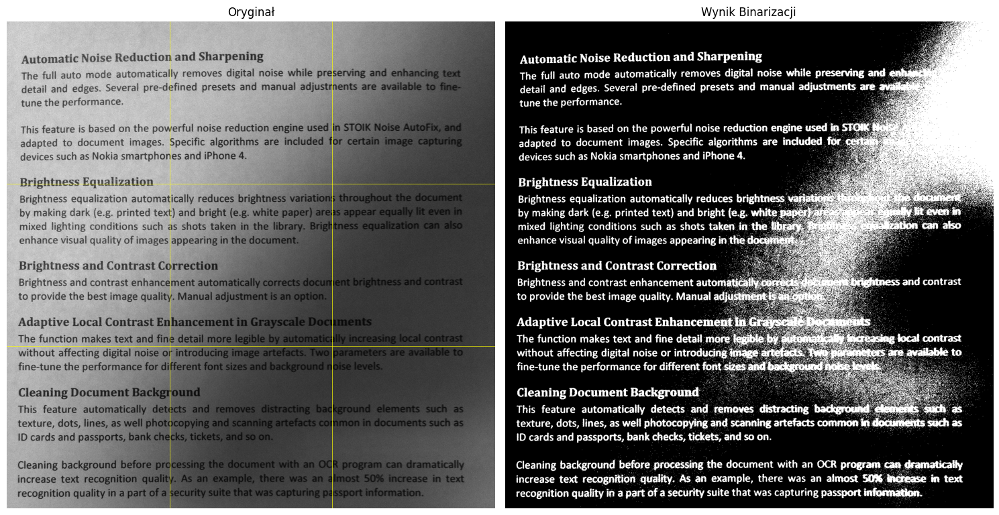

In [28]:
grid_size = (3, 3)
local_otsu_result = binarize_grid_otsu(tekst_original, grid_size)
display_images(tekst_original, local_otsu_result, grid=grid_size)

## histogramy tilesów wyprintować
